In [1]:
import sys
sys.path.append('C:/Users/LENOVO/Desktop/Fitness Tracker/modules/')
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from DataTransformation import LowPassFilter
from scipy.signal import argrelextrema
from sklearn.metrics import mean_absolute_error

In [2]:
pd.options.mode.chained_assignment = None


# Plot settings
plt.style.use("fivethirtyeight")
plt.rcParams["figure.figsize"] = (20, 5)
plt.rcParams["figure.dpi"] = 100
plt.rcParams["lines.linewidth"] = 2

In [3]:
df = pd.read_pickle("interin/data_processed.pkl")
df

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set
epoch (ms),,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,B,bench,heavy,30
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,B,bench,heavy,30
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,B,bench,heavy,30
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,B,bench,heavy,30
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,B,bench,heavy,30
...,...,...,...,...,...,...,...,...,...,...
2019-01-20 17:33:27.000,-0.048000,-1.041500,-0.076500,1.4146,-5.6218,0.2926,E,row,medium,90
2019-01-20 17:33:27.200,-0.037000,-1.030333,-0.053333,-2.7684,-0.5854,2.2440,E,row,medium,90
2019-01-20 17:33:27.400,-0.060000,-1.031000,-0.082000,2.8416,-5.1342,-0.1220,E,row,medium,90


In [4]:
df = df[df["label"] != "rest"]
df

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set
epoch (ms),,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,B,bench,heavy,30
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,B,bench,heavy,30
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,B,bench,heavy,30
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,B,bench,heavy,30
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,B,bench,heavy,30
...,...,...,...,...,...,...,...,...,...,...
2019-01-20 17:33:27.000,-0.048000,-1.041500,-0.076500,1.4146,-5.6218,0.2926,E,row,medium,90
2019-01-20 17:33:27.200,-0.037000,-1.030333,-0.053333,-2.7684,-0.5854,2.2440,E,row,medium,90
2019-01-20 17:33:27.400,-0.060000,-1.031000,-0.082000,2.8416,-5.1342,-0.1220,E,row,medium,90


In [5]:
acc_r = df["acc_x"] ** 2 + df["acc_y"] ** 2 + df["acc_z"] ** 2 
gyr_r = df["gyr_x"] ** 2 + df["gyr_y"] ** 2 + df["gyr_z"] ** 2 


In [6]:
acc_r

epoch (ms)
2019-01-11 15:08:05.200    0.959752
2019-01-11 15:08:05.400    0.948193
2019-01-11 15:08:05.600    0.948277
2019-01-11 15:08:05.800    0.921827
2019-01-11 15:08:06.000    0.931134
                             ...   
2019-01-20 17:33:27.000    1.092879
2019-01-20 17:33:27.200    1.065800
2019-01-20 17:33:27.400    1.073285
2019-01-20 17:33:27.600    1.055482
2019-01-20 17:33:27.800    1.074573
Length: 7899, dtype: float64

In [7]:
gyr_r

epoch (ms)
2019-01-11 15:08:05.200    10.404654
2019-01-11 15:08:05.400     8.336328
2019-01-11 15:08:05.600     8.624326
2019-01-11 15:08:05.800    89.747245
2019-01-11 15:08:06.000    21.377539
                             ...    
2019-01-20 17:33:27.000    33.691343
2019-01-20 17:33:27.200    13.042268
2019-01-20 17:33:27.400    34.449584
2019-01-20 17:33:27.600     1.378254
2019-01-20 17:33:27.800    18.350756
Length: 7899, dtype: float64

In [8]:
df["acc_r"] = np.sqrt(acc_r)
df["gyr_r"] = np.sqrt(gyr_r)

# Spliting the Data Train and Test 

In [9]:
bench_df = df[df["label"] == "bench"]
dead_df = df[df["label"] == "dead"]
row_df = df[df["label"] == "roe"]
ohp_df = df[df["label"] == "ohp"]
squat_df = df[df["label"] == "squat"]

In [10]:
plot_df = bench_df

<Axes: xlabel='epoch (ms)'>

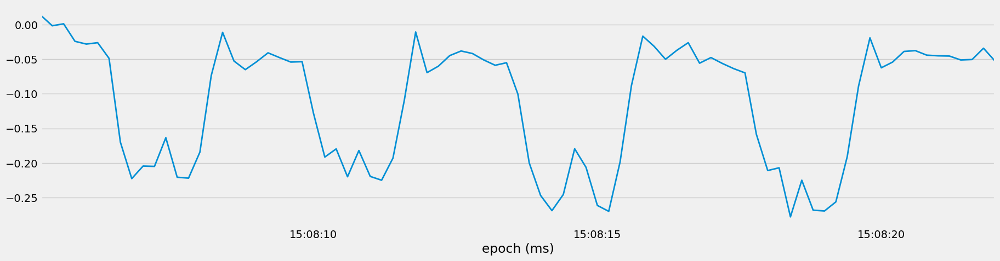

In [11]:
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["acc_x"].plot()


<Axes: xlabel='epoch (ms)'>

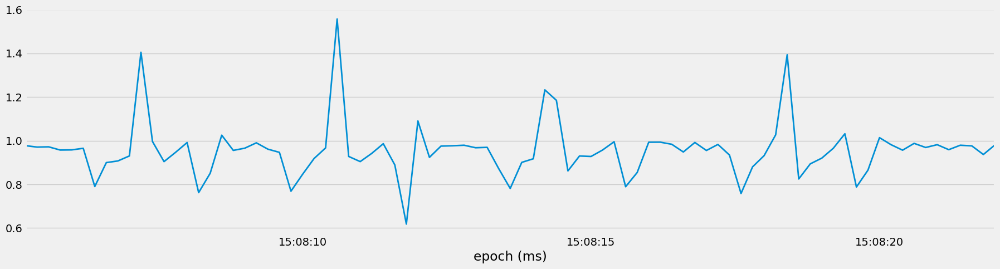

In [12]:
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["acc_y"].plot()


<Axes: xlabel='epoch (ms)'>

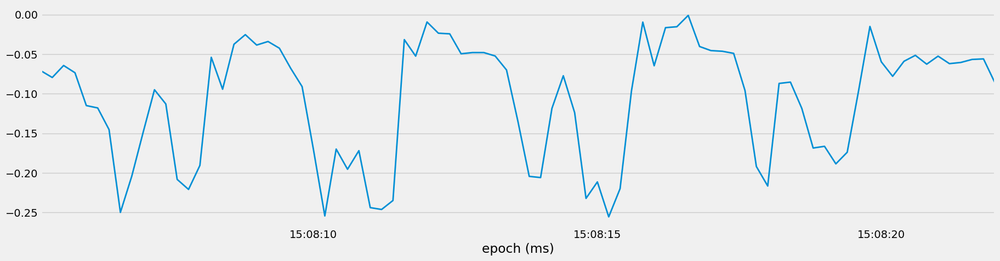

In [13]:
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["acc_z"].plot()


<Axes: xlabel='epoch (ms)'>

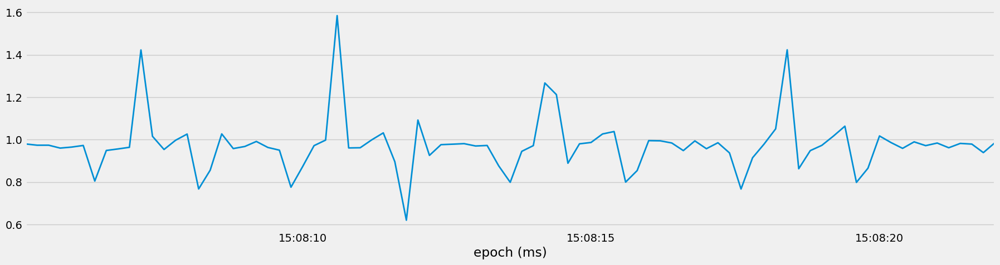

In [14]:
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["acc_r"].plot()

<Axes: xlabel='epoch (ms)'>

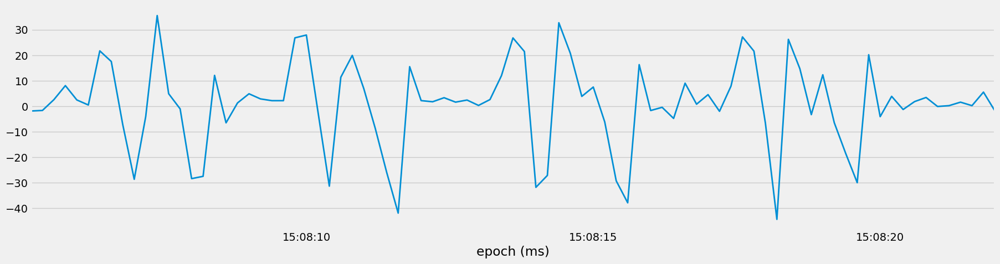

In [15]:
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["gyr_x"].plot()

<Axes: xlabel='epoch (ms)'>

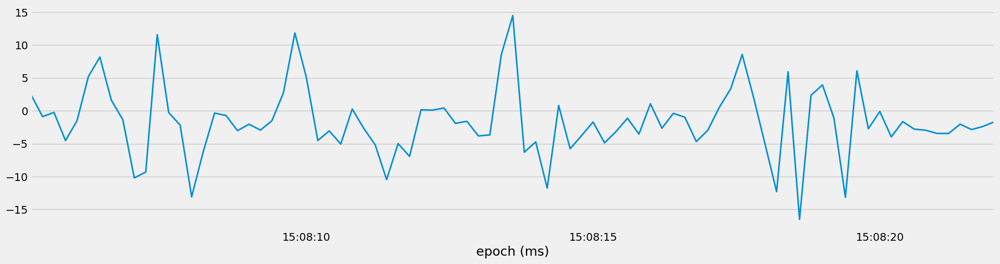

In [16]:
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["gyr_y"].plot()

<Axes: xlabel='epoch (ms)'>

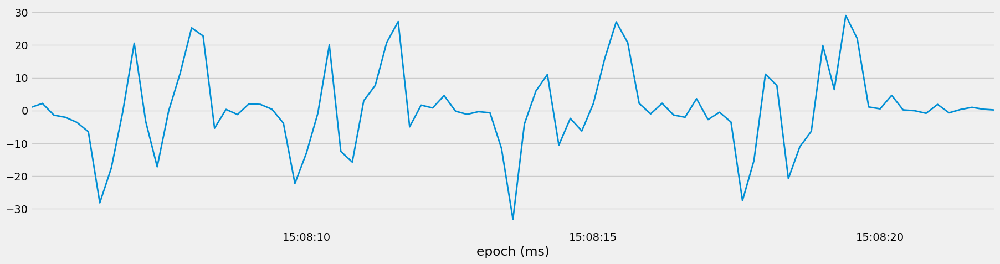

In [17]:
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["gyr_z"].plot()

<Axes: xlabel='epoch (ms)'>

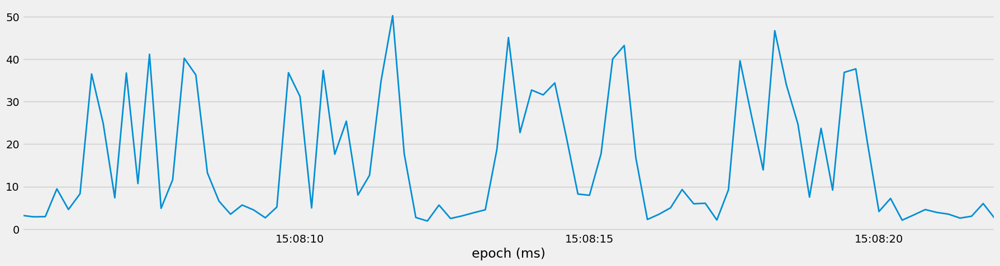

In [18]:
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["gyr_r"].plot()

# Configuration of LowPass Filter

In [19]:
fs = (1000/200)
LowPass =LowPassFilter()

In [20]:
def get_first_unique_set(df):
    unique_sets = df["set"].unique()
    if len(unique_sets) > 0:
        return df[df["set"] == unique_sets[0]]
    else:
        return df.iloc[0:0]  # Return an empty DataFrame with the same columns

bench_set = get_first_unique_set(bench_df)
squat_set = get_first_unique_set(squat_df)
row_set   = get_first_unique_set(row_df)
ohp_set   = get_first_unique_set(ohp_df)
dead_set  = get_first_unique_set(dead_df)


<Axes: xlabel='epoch (ms)'>

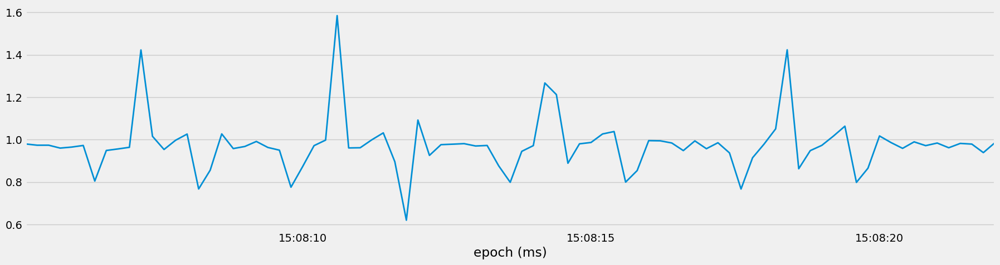

In [21]:
bench_set["acc_r"].plot()

<Axes: xlabel='epoch (ms)'>

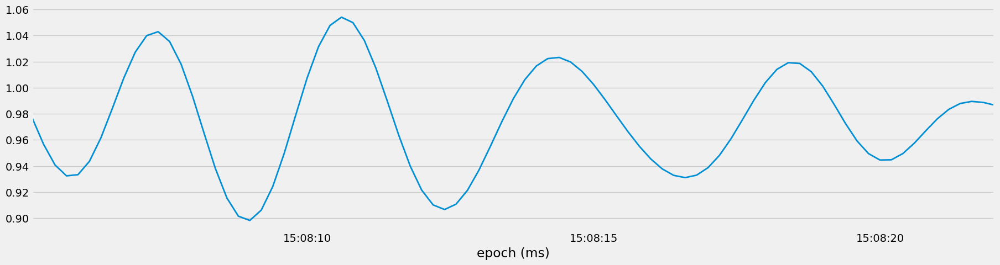

In [22]:
columns = "acc_r"
LowPass.low_pass_filter(bench_set,col = columns, sampling_frequency=fs, cutoff_frequency=0.4, order=10)[columns + "_lowpass"].plot()


<Axes: xlabel='epoch (ms)'>

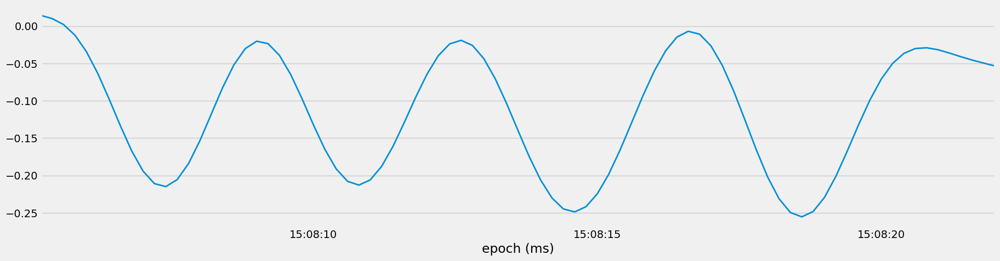

In [23]:
columns = "acc_x"
LowPass.low_pass_filter(bench_set,col = columns, sampling_frequency=fs, cutoff_frequency=0.4, order=10)[columns + "_lowpass"].plot()


<Axes: xlabel='epoch (ms)'>

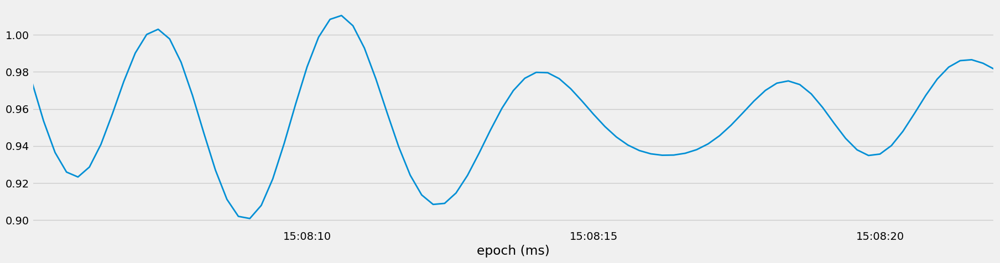

In [24]:
columns = "acc_y"
LowPass.low_pass_filter(bench_set,col = columns, sampling_frequency=fs, cutoff_frequency=0.4, order=10)[columns + "_lowpass"].plot()


<Axes: xlabel='epoch (ms)'>

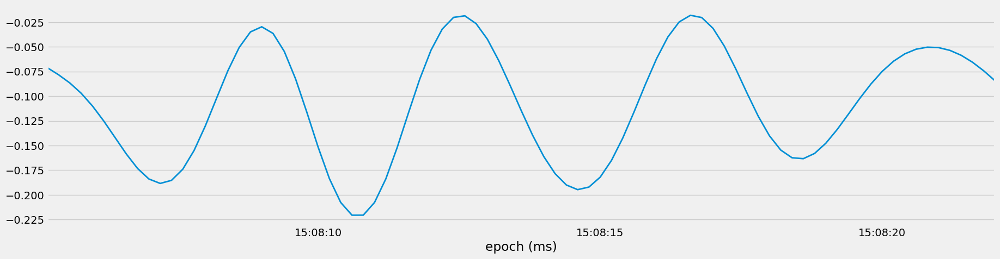

In [25]:
columns = "acc_z"
LowPass.low_pass_filter(bench_set,col = columns, sampling_frequency=fs, cutoff_frequency=0.4, order=10)[columns + "_lowpass"].plot()


<Axes: xlabel='epoch (ms)'>

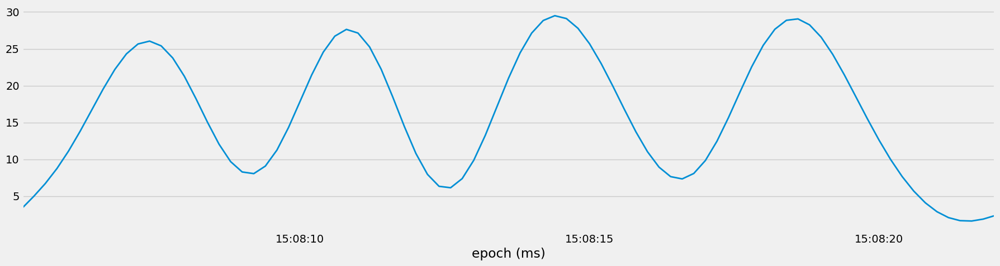

In [26]:
columns = "gyr_r"
LowPass.low_pass_filter(bench_set,col = columns, sampling_frequency=fs, cutoff_frequency=0.4, order=10)[columns + "_lowpass"].plot()


<Axes: xlabel='epoch (ms)'>

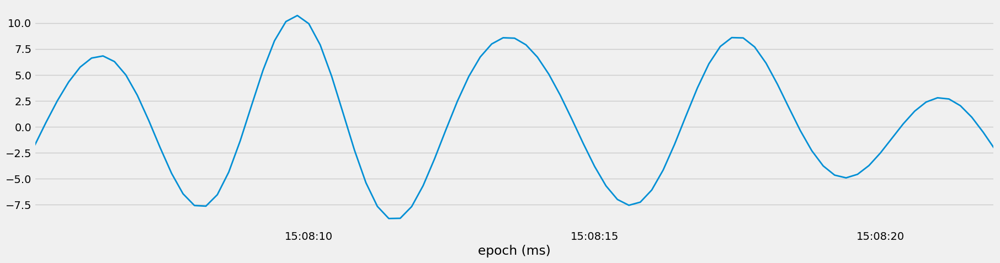

In [27]:
columns = "gyr_x"
LowPass.low_pass_filter(bench_set,col = columns, sampling_frequency=fs, cutoff_frequency=0.4, order=10)[columns + "_lowpass"].plot()


<Axes: xlabel='epoch (ms)'>

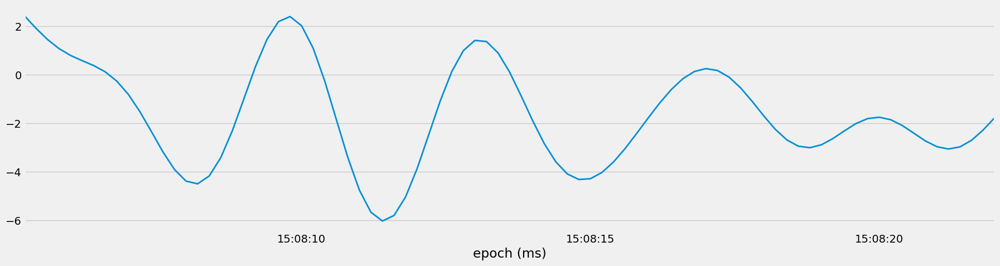

In [28]:
columns = "gyr_y"
LowPass.low_pass_filter(bench_set,col = columns, sampling_frequency=fs, cutoff_frequency=0.4, order=10)[columns + "_lowpass"].plot()


<Axes: xlabel='epoch (ms)'>

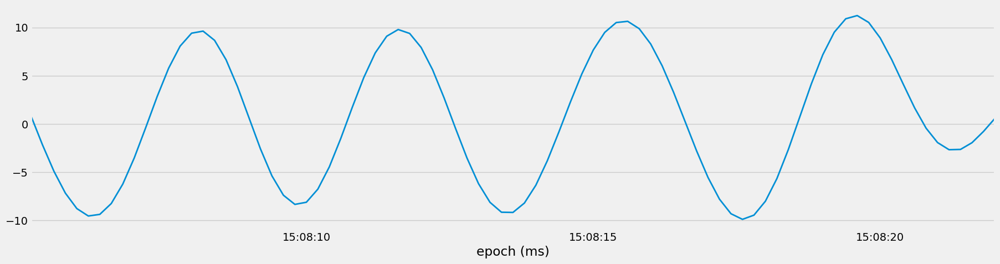

In [29]:
columns = "gyr_z"
LowPass.low_pass_filter(bench_set,col = columns, sampling_frequency=fs, cutoff_frequency=0.4, order=10)[columns + "_lowpass"].plot()


# create function to count repetition

In [54]:
def count_reps(dataset , cutoff = 0.4 , order = 10 , column = "acc_r"):
    data = LowPass.low_pass_filter(dataset, col=column, sampling_frequency=fs, cutoff_frequency=cutoff, order=order)
    
    # Find local maxima
    indexes = argrelextrema(data[column + "_lowpass"].values, np.greater)
    peaks = data.iloc[indexes]
    
    
    
    fig,ax = plt.subplots()
    plt.plot(dataset[f"{column}_lowpass"])
    plt.plot(peaks[f"{column}_lowpass"],"o",color = "red")
    ax.set_ylabel(f"{column}_lowpass")
    exercise = dataset["label"].iloc[0].title()
    category =dataset["category"].iloc[0].title()
    plt.title(f"{category} {exercise} : {len(peaks)} Reps")
    plt.show()
    return len(peaks)

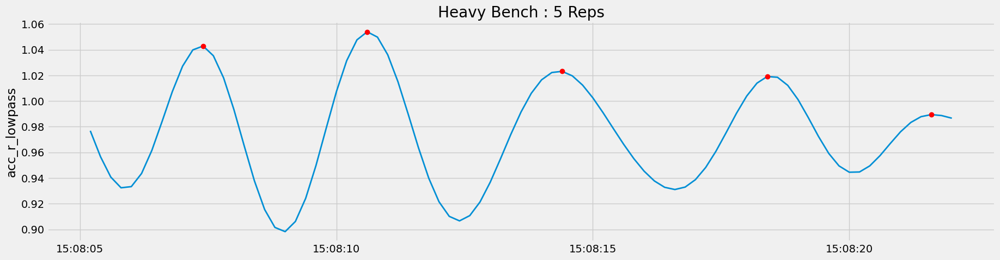

5

In [55]:
count_reps(bench_set , cutoff = 0.4)


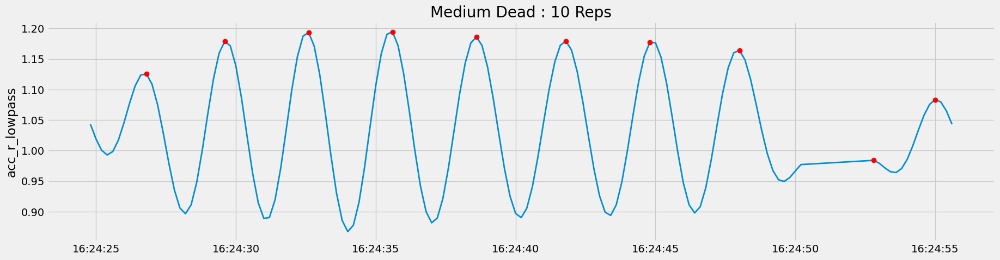

10

In [56]:
count_reps(dead_set , cutoff = 0.4)

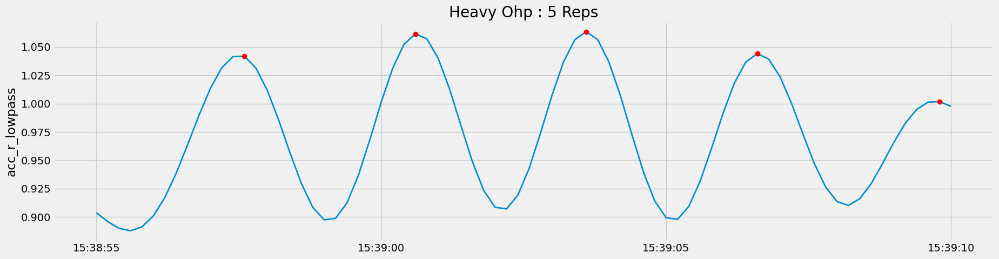

5

In [57]:
count_reps(ohp_set , cutoff = 0.35)

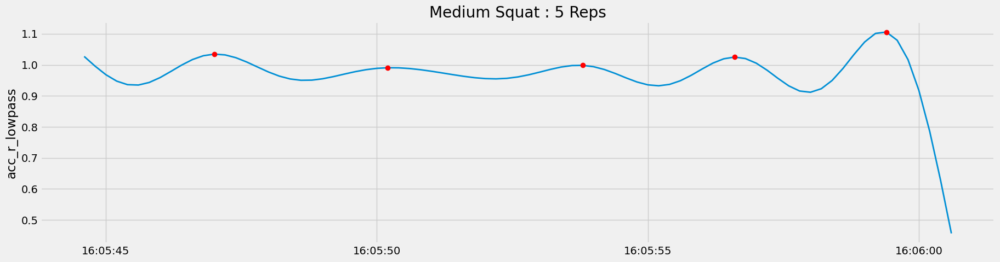

5

In [58]:
count_reps(squat_set , cutoff = 0.34)

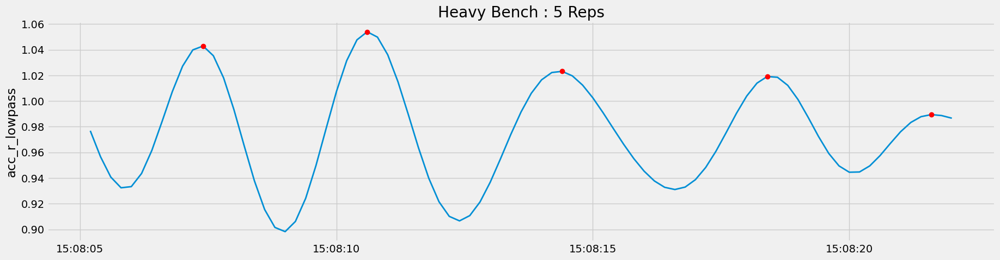

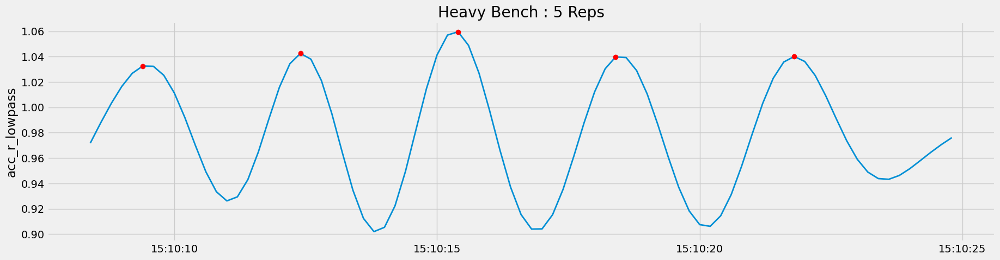

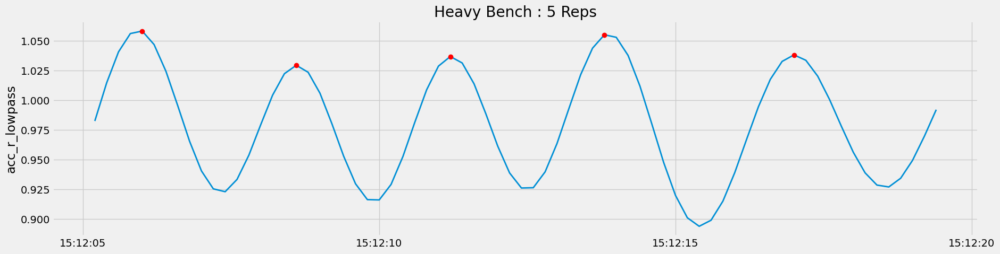

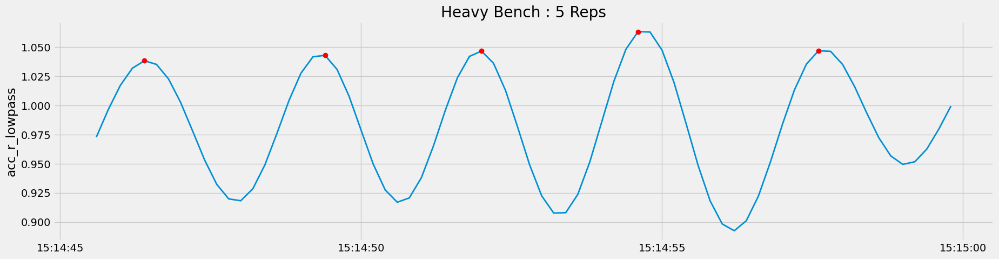

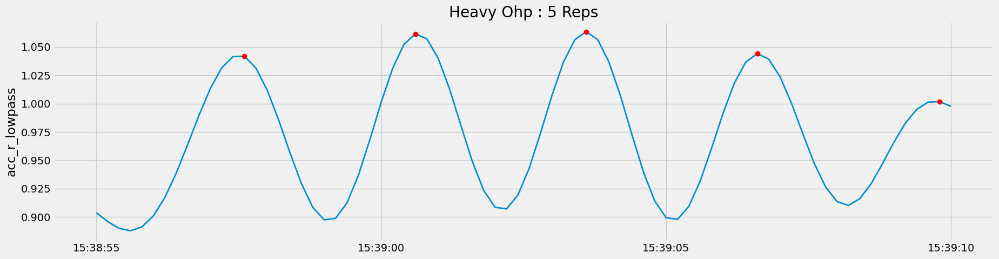

...

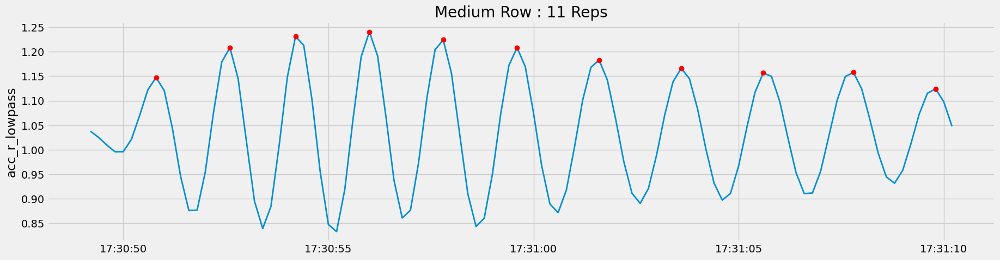

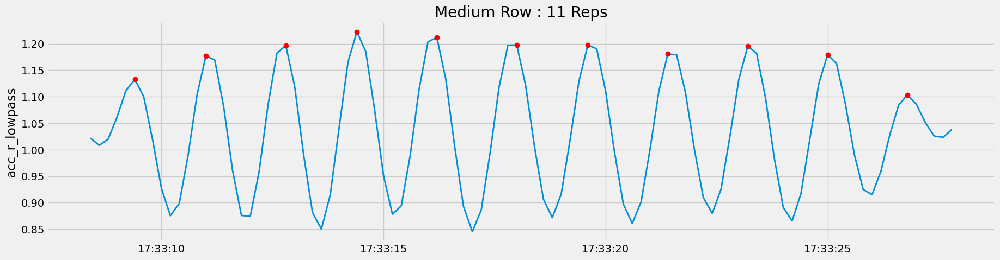

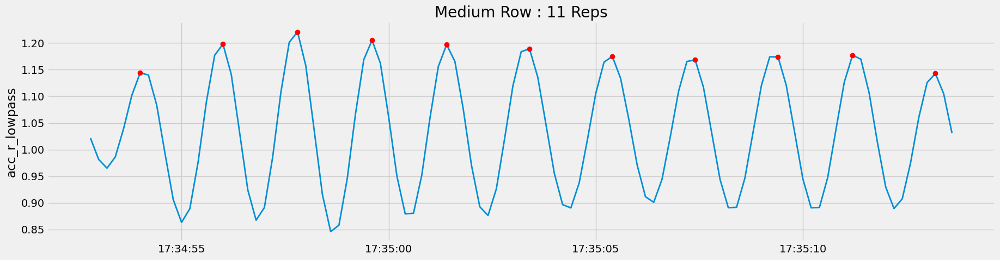

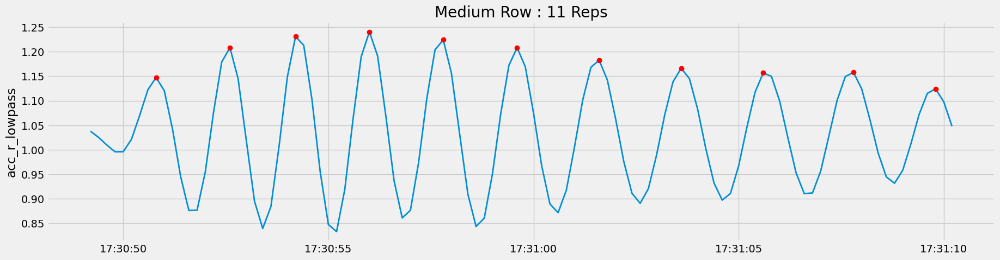

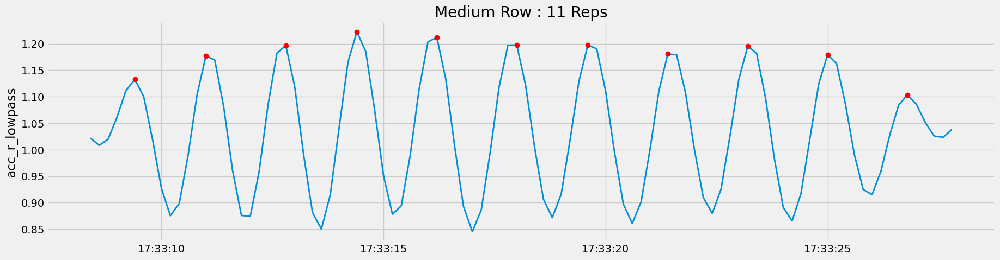

,label,category,set,reps,pres_prod,reps_pred
0,bench,heavy,1,5,0,5.0
1,bench,heavy,2,5,0,4.0
2,bench,heavy,3,5,0,5.0
3,bench,heavy,4,5,0,5.0
4,bench,heavy,30,5,0,5.0
...,...,...,...,...,...,...
80,squat,medium,28,10,0,8.0
81,squat,medium,29,10,0,8.0
82,squat,medium,38,10,0,7.0
83,squat,medium,63,10,0,11.0


In [63]:
df["reps"] = df["category"].apply(lambda x: 5 if x == "heavy" else 10)
rep_df = df.groupby(["label", "category", "set"])["reps"].max().reset_index()
rep_df["pres_prod"] = 0
for s in df["set"].unique():
    subset = df[df["set"] == s]
    
    column = "acc_r"
    cutoff = 0.4
    
    
    if subset["label"].iloc[0] == "squat":
        cutoff = 0.35
        
    if subset["label"].iloc[0] == "row":
        cutoff = 0.65
        col = "gyr_x"
        
    if subset["label"].iloc[0] == "ohp":
        cutoff = 0.35
        
        
        
    reps = count_reps(subset , cutoff = cutoff , column = column)
    
    rep_df.loc[rep_df["set"] == s , "reps_pred"] = reps
    
rep_df

<Axes: xlabel='label,category'>

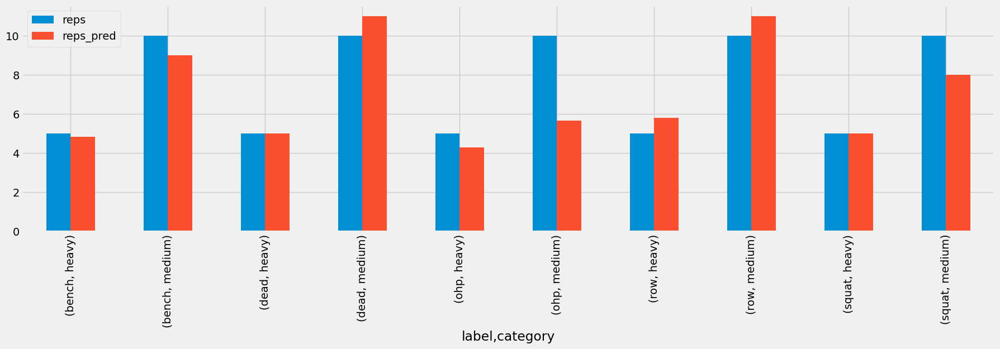

In [65]:
error = mean_absolute_error(rep_df["reps"], rep_df["reps_pred"]).round(2)
rep_df.groupby(["label", "category"])[["reps", "reps_pred"]].mean().plot.bar()
